In [1]:
import numpy as np
from tqdm import tqdm
import threading
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
koeff_dict = {'alfa_k' : 5.06885448587749E-18,
              'beta_k' : -7.99571823033888E-12,
              'gamma' : 3.21434050397236E-06,
              'delta' : -0.681525968280185,
              'alfa_d' : 0.000128115255705624,
              'beta_d' : 44.7685203039035}

In [3]:
def algorithm(M, T, koeff_dict):
    k = 0
    d = 0
    M_tk = 0
    k = koeff_dict['alfa_k'] * M**3 + koeff_dict['beta_k'] * M**2 + koeff_dict['gamma'] * M + koeff_dict['delta'] 
    d = koeff_dict['alfa_d'] * M + koeff_dict['beta_d']
    M_tk = M - k * T**2 - d * T
    return M_tk

In [14]:
algorithm(879670, 20, koeff_dict)

876756.9708216796

In [8]:
def test(mass):
    logs = []
    for i in range(-50, 51):
        logs.append([i, algorithm(mass, i, koeff_dict)])
    return logs

In [9]:
t = pd.DataFrame(test(213596))

In [10]:
t_1 = pd.DataFrame(test(879670))

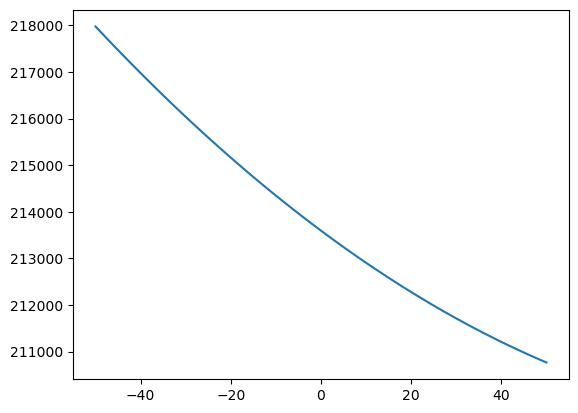

In [11]:
plt.plot(t[0], t[1]) 

In [12]:
x, y = np.meshgrid(np.linspace(8176, 879670, 1000), np.linspace(-40, 41, 81))
z = np.zeros_like(x)
for i in range(81):
    for j in range(1000):
        z[i, j] = algorithm(x[i, j], y[i, j], koeff_dict)


In [13]:
fig = go.Figure(data=[go.Surface(z=z, x=x, y=y)])
fig.update_layout(title='Пространство преобразования', autosize=True,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()